In [1]:
# Load libraries
from keras.applications.vgg16 import VGG16, preprocess_input, decode_predictions
from keras.preprocessing import image
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import sys

model = VGG16(weights='imagenet')

Using TensorFlow backend.


In [2]:
def predict(filename, featuresize, scale=1.0):
    img = image.load_img(filename, target_size=(224, 224))
    return predictimg(img, featuresize, scale=1.0)

def predictpart(filename, featuresize, scale=1.0, size=1):
    im = Image.open(filename)
    width, height = im.size
    im = im.resize((width * size, height * size))
    im_list = np.asarray(im)
    # partition
    out_img = []
    if size > 1: 
        v_split = size
        h_split = size
        [out_img.extend(np.hsplit(h_img, h_split)) for h_img in np.vsplit(im_list, v_split)]
    else:
        out_img.append(im_list)
    reslist = []
    for offset in range(size * size):
        img = Image.fromarray(out_img[offset])
        reslist.append(predictimg(img, featuresize, scale))
    return reslist

def predictimg(img, featuresize, scale=1.0):
    width, height = img.size
    img = img.resize((int(width * scale), int(height * scale)))
    img = img.resize((224, 224))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    preds = model.predict(preprocess_input(x))
    results = decode_predictions(preds, top=featuresize)[0]
    return results

def showimg(filename, title, i, scale=1.0, col=2, row=5):
    im = Image.open(filename)
    width, height = im.size
    im = im.resize((int(width * scale), int(height * scale)))
    im = im.resize((width, height))
    im_list = np.asarray(im)
    plt.subplot(col, row, i)
    plt.title(title)
    plt.axis("off")
    plt.imshow(im_list)
    
def showpartimg(filename, title, i, size, scale=1.0, col=2, row=5):
    im = Image.open(filename)
    width, height = im.size
    im = im.resize((int(width * scale), int(height * scale)))
    #im = im.resize((width, height))
    im = im.resize((width * size, height * size))
    im_list = np.asarray(im)
    # partition
    out_img = []
    if size > 1: 
        v_split = size
        h_split = size
        [out_img.extend(np.hsplit(h_img, h_split)) for h_img in np.vsplit(im_list, v_split)]
    else:
        out_img.append(im_list)
    # draw image
    for offset in range(size * size):
        im_list = out_img[offset]
        pos = i + offset
        print(str(col) + ' ' + str(row) + ' ' + str(pos))
        plt.subplot(col, row, pos)
        plt.title(title)
        plt.axis("off")
        plt.imshow(im_list)
        out_img[offset] = Image.fromarray(im_list)
    return out_img

2 5 1


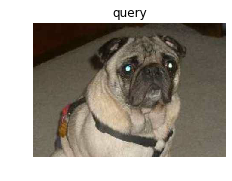

('n02110958', 'pug', 0.83183455)
('n02108422', 'bull_mastiff', 0.07784116)
('n02808304', 'bath_towel', 0.00815668)
('n02098413', 'Lhasa', 0.007912464)
('n02883205', 'bow_tie', 0.004999949)
('n02108915', 'French_bulldog', 0.004577248)
('n04409515', 'tennis_ball', 0.004210775)
('n04209133', 'shower_cap', 0.0033766704)
('n02086240', 'Shih-Tzu', 0.0033179633)
('n02086079', 'Pekinese', 0.003144418)



In [19]:
# Predict an image
scale = 1.0
filename = "dogs-vs-cats/train/mini/dog.12466.jpg"
plt.figure(figsize=(20, 10))

#showimg(filename, "query", i+1, scale)
imgs = showpartimg(filename, "query", 1, 1, scale)
plt.show()

for img in imgs:
    reslist = predictpart(filename, 10, scale)
    for results in reslist:
        for result in results:
            print(result)
    print()

In [4]:
import os
from path import Path
from elasticsearch import Elasticsearch

es = Elasticsearch(host='localhost', port=9200)

In [5]:
#raiseFieldLimit = '''
#{  
#  "index.mapping.total_fields.limit": 2000
#}'''
#
#es.indices.create(index='myindex', body=raiseFieldLimit)
!curl GET http://localhost:9200

curl: (6) Could not resolve host: GET
{
  "name" : "Hirokis-MacBook-Pro.local",
  "cluster_name" : "elasticsearch",
  "cluster_uuid" : "K75X2XDvRSmpsEZOcayD8A",
  "version" : {
    "number" : "7.0.1",
    "build_flavor" : "default",
    "build_type" : "tar",
    "build_hash" : "e4efcb5",
    "build_date" : "2019-04-29T12:56:03.145736Z",
    "build_snapshot" : false,
    "lucene_version" : "8.0.0",
    "minimum_wire_compatibility_version" : "6.7.0",
    "minimum_index_compatibility_version" : "6.0.0-beta1"
  },
  "tagline" : "You Know, for Search"
}


In [6]:
import math
import binascii

def createindex(indexname):
    if es.indices.exists(index=indexname):
        es.indices.delete(index=indexname)
    es.indices.create(index=indexname,  body={
        "settings": {
            "index.mapping.total_fields.limit": 10000,
        }
    })

def loadimages(directory):
    imagefiles = []
    for file in os.listdir(directory):
        if file.rfind('.jpg') < 0:
            continue
        filepath = os.path.join(directory, file)
        imagefiles.append(filepath)
    return imagefiles

def indexfiles(indexname, directory, featuresize=10, docsize=1000):
    imagefiles = loadimages(directory)
    for i in range(len(imagefiles)):
        if i >= docsize:
            return
        filename = imagefiles[i]
        indexfile(indexname, filename, i, featuresize)
        sys.stdout.write("\r%d" % (i + 1))
        sys.stdout.flush()
    es.indices.refresh(index="image-search")    

def indexfile(indexname, filename, i, featuresize):
    rounddown = 16
    doc = {'f': filename, 's':{}}  # filename, synset
    results = predict(filename, featuresize) 
    l2 = float(0)
    l2_map = float(0)
    for result in results:
        score = float(str(result[2]))
        l2 = l2 + score ** 2
    for result in results:
        score = float(str(result[2]))
        synset = doc['s']
        #wnid = int(result[0][1:])
        wnid = result[0]
        #dictionary[wnid] = hex(wnid[1:])[1:]
        id = str(hex(int(wnid[1:])-2000000)[2:])
        synset[id] = {
            'i': wnid,     # wnid
            'w': result[1],   # words
            's': round(score, rounddown),         # score
            'c': round(score / math.sqrt(l2), rounddown),         # L2 norm
            'ss': round(score ** 2, rounddown),         # score^2
            #'l2': round(l2, rounddown), 
        }
    count = es.count(index=indexname, doc_type='image')['count']
    res = es.index(index=indexname, doc_type='image', id=(count + i), body=doc)
    

In [143]:
# ES_JAVA_OPTS="-Xms4000m -Xmx4000m" ./bin/elasticsearch

createindex("image-search-2")

directory = "dogs-vs-cats/train/"
indexfiles("image-search-2", directory, 1000, 30000)

25000

In [7]:
def searchimg(indexname, filename, num=10, topk=10, scoretype='dot', scale=1.0, partition=1):
    plt.figure(figsize=(20, 10))
    
    #showimg(filename, "query", i+1, scale)
    imgs = showpartimg(filename, "query", 1, partition, scale)
    plt.show()

    reslist = []
    for img in imgs:
        results = predictimg(img, num, scale)
        for result in results:
            print(result)
        print()
        reslist.append(search(indexname, results, num, topk, scoretype))
    return reslist

def search(indexname, synsets, num, topk, scoretype='dot', disp=True):
    base = "0.0000"
    rounddown = 4
    if scoretype == 'dot':
        inline = base
        for synset in synsets:
            score = round(synset[2], rounddown)
            if score <= 0.0:
                continue
            wnid = synset[0]
            id = str(hex(int(wnid[1:])-2000000)[2:])
            words = synset[1]
            inline += "+doc['s." + id + ".s'].value*" + str(score)
    elif scoretype == 'man':
        #inline = str(round(1/len(synsets), rounddown)) + "*(" + str(len(synsets))
        inline = str(len(synsets) / len(synsets))
        for synset in synsets:
            score = round(synset[2], rounddown)
            if score <= 0.0:
                continue
            wnid = synset[0]
            id = str(hex(int(wnid[1:])-2000000)[2:])
            words = synset[1]
            inline += "-Math.abs(doc['s." + id + ".s'].value*" + str(1/len(synsets)) + "-" + str(score / len(synsets)) + ")"
        #inline += ")"
    elif scoretype == 'var':
        l2 = float(0)
        for synset in synsets:
            score = round(synset[2], rounddown)
            if score <= 0.0:
                continue
            l2 = l2 + (1 - score ** 2)
        #inline = str(round(1/len(synsets), rounddown)) + "*(" + str(round(l2, rounddown))
        inline = str(round(l2/len(synsets), rounddown))
        for synset in synsets:
            score = round(synset[2], rounddown)
            if score <= 0.0:
                continue
            wnid = synset[0]
            id = str(hex(int(wnid[1:])-2000000)[2:])
            words = synset[1]
            inline += "+doc['s." + id + ".s'].value*" + str(round(2 * score/len(synsets), rounddown)) + "-doc['s." + id + ".ss'].value/" + str(round(len(synsets), rounddown)) 
        #inline += ")"
    elif scoretype == 'var2':
        l2 = float(0)
        for synset in synsets:
            score = round(synset[2], rounddown)
            if score <= 0.0:
                continue
            l2 = l2 + score ** 2
        #inline = str(round(1/len(synsets), rounddown)) + "*(" + str(round(l2, rounddown))
        normalize = (len(synsets)+0)*len(synsets)
        inline = str((len(synsets)+0)/len(synsets)) + str(round(-l2/normalize, rounddown))
        for synset in synsets:
            score = round(synset[2], rounddown)
            if score <= 0.0:
                continue
            wnid = synset[0]
            id = str(hex(int(wnid[1:])-2000000)[2:])
            words = synset[1]
            inline += "+doc['s." + id + ".s'].value*" + str(round(2 * score/normalize, rounddown)) + "-doc['s." + id + ".ss'].value/" + str(round(normalize, rounddown)) 
        #inline += ")"
    elif scoretype == 'cos':
        inline = base
        for synset in synsets:
            score = round(synset[2], rounddown)
            if score <= 0.0:
                continue
            wnid = synset[0]
            id = str(hex(int(wnid[1:])-2000000)[2:])
            words = synset[1]
            inline += "+doc['s." + id + ".c'].value*" + str(score)
    elif scoretype == '+cos':
        inline = base
        for synset in synsets:
            score = round(synset[2], rounddown)
            if score <= 0.0:
                continue
            wnid = synset[0]
            id = str(hex(int(wnid[1:])-2000000)[2:])
            words = synset[1]
            inline += "+doc['s." + id + ".s'].value*" + str(score)

    #print(inline)
    #return
    
    res = es.search(index=indexname, request_timeout=10000, body={
        "size": topk,
        "query": {
            "function_score": {
                "query": {"match_all": {}},
                "script_score" : {"script" : {"inline": inline}}
        }}})

    if disp==True:
        print("Got " +  str(res['hits']['total']['value']) + " Hits:")
        topres = res['hits']['hits'][0:topk]
        for hit in topres:
            print(str(hit["_id"]) + " " + str(hit["_source"]["f"]) + " "  + str(hit["_score"]))
        plt.figure(figsize=(20, 10))

        for i in range(len(topres)):
            hit = topres[i]
            row = 5
            col = int(topk / 5)
            if i >= 25:
                break
            showimg(hit["_source"]["f"], hit["_id"], i+1, col, row)
        plt.show()
    
    return res


2 5 1


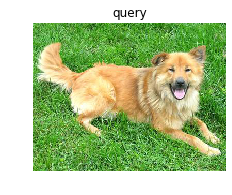

('n02112137', 'chow', 0.67588276)
('n02108551', 'Tibetan_mastiff', 0.05719839)
('n02106662', 'German_shepherd', 0.03735141)
('n02099601', 'golden_retriever', 0.028765572)
('n02096294', 'Australian_terrier', 0.022860283)
('n02106030', 'collie', 0.020240845)
('n02112018', 'Pomeranian', 0.015477174)
('n02094258', 'Norwich_terrier', 0.014751237)
('n02113023', 'Pembroke', 0.014505376)
('n02097474', 'Tibetan_terrier', 0.013426901)

Got 10000 Hits:
31372 dogs-vs-cats/train/dog.3882.jpg 0.99961245
36323 dogs-vs-cats/train/dog.10312.jpg 0.999538
19107 dogs-vs-cats/train/dog.3690.jpg 0.9994473
29985 dogs-vs-cats/train/dog.9213.jpg 0.9993688
37945 dogs-vs-cats/train/dog.1216.jpg 0.9992787
13564 dogs-vs-cats/train/dog.10690.jpg 0.999203
20291 dogs-vs-cats/train/dog.3928.jpg 0.99898225
19673 dogs-vs-cats/train/dog.11205.jpg 0.99878967
41015 dogs-vs-cats/train/dog.2287.jpg 0.9983447
41001 dogs-vs-cats/train/dog.11861.jpg 0.9983008


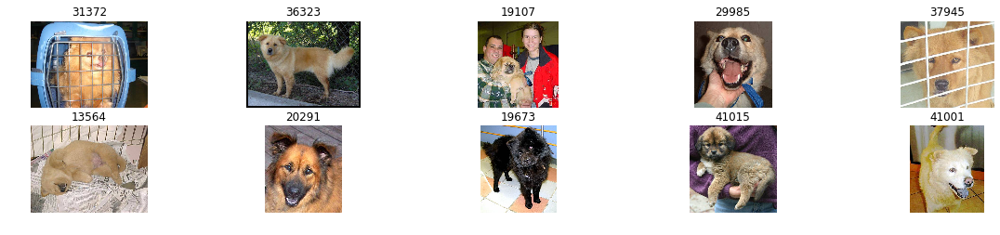

In [8]:
filename = "dogs-vs-cats/test1/4.jpg"
_ = searchimg('image-search-2', filename, 10, 10, 'var', 1.0, 1)

In [676]:
filename = "dogs-vs-cats/test1/4.jpg"
_ = searchimg('image-search-2', filename, 1000, 10, 'man', 1.0, 2)

ValueError: num must be 1 <= num <= 10, not 220

<Figure size 1440x720 with 0 Axes>

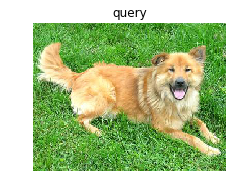

('n02112137', 'chow', 0.84525466)
('n02108551', 'Tibetan_mastiff', 0.036960315)
('n02099601', 'golden_retriever', 0.020223998)
('n02106662', 'German_shepherd', 0.013640449)
('n02097474', 'Tibetan_terrier', 0.011159383)
('n02096294', 'Australian_terrier', 0.010261376)
('n02106030', 'collie', 0.009953969)
('n02094258', 'Norwich_terrier', 0.008431903)
('n02111129', 'Leonberg', 0.00419593)
('n02113023', 'Pembroke', 0.0041000256)

Got 10000 Hits:
20389 dogs-vs-cats/train/dog.3915.jpg 0.9900787
15593 dogs-vs-cats/train/dog.7340.jpg 0.98914933
36897 dogs-vs-cats/train/dog.525.jpg 0.9878697
32973 dogs-vs-cats/train/dog.6858.jpg 0.98717916
4551 dogs-vs-cats/train/dog.3782.jpg 0.98629403
47239 dogs-vs-cats/train/dog.786.jpg 0.98434156
31020 dogs-vs-cats/train/dog.9398.jpg 0.98364365
10922 dogs-vs-cats/train/dog.8808.jpg 0.98245084
21062 dogs-vs-cats/train/dog.6474.jpg 0.9823106
23801 dogs-vs-cats/train/dog.45.jpg 0.98199797


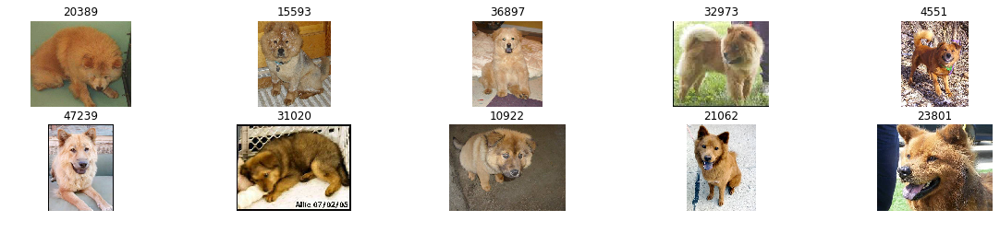

In [448]:
filename = "dogs-vs-cats/test1/4.jpg"
_ = searchimg('image-search-2', filename, 10, 10, 'man', 0.8)

2 5 1
2 5 2
2 5 3
2 5 4


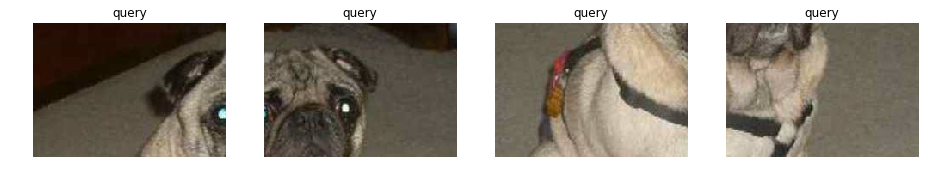

('n02110958', 'pug', 0.3210549)
('n02091467', 'Norwegian_elkhound', 0.13918346)
('n02093428', 'American_Staffordshire_terrier', 0.074534215)
('n02093256', 'Staffordshire_bullterrier', 0.055934023)
('n02096585', 'Boston_bull', 0.048457388)
('n02108422', 'bull_mastiff', 0.040170632)
('n02088632', 'bluetick', 0.028590625)
('n02108915', 'French_bulldog', 0.028343901)
('n02087046', 'toy_terrier', 0.0269151)
('n02108089', 'boxer', 0.023436418)
('n02109047', 'Great_Dane', 0.012886324)
('n02091032', 'Italian_greyhound', 0.012493845)
('n02105162', 'malinois', 0.01214426)
('n02091134', 'whippet', 0.011334289)
('n02099712', 'Labrador_retriever', 0.009994943)
('n02107312', 'miniature_pinscher', 0.008683143)
('n02100236', 'German_short-haired_pointer', 0.008410307)
('n02097209', 'standard_schnauzer', 0.006838529)
('n02097047', 'miniature_schnauzer', 0.0063731517)
('n02085620', 'Chihuahua', 0.0059012044)
('n02123597', 'Siamese_cat', 0.004950255)
('n02093754', 'Border_terrier', 0.0048232554)
('n02088

Got 10000 Hits:
30832 dogs-vs-cats/train/dog.11340.jpg 0.9993041
36660 dogs-vs-cats/train/dog.10104.jpg 0.99917537
33232 dogs-vs-cats/train/dog.12274.jpg 0.99916184
22100 dogs-vs-cats/train/dog.6728.jpg 0.99914575
23070 dogs-vs-cats/train/dog.11992.jpg 0.99913317
9532 dogs-vs-cats/train/dog.1756.jpg 0.9991284
27667 dogs-vs-cats/train/dog.4318.jpg 0.99912816
39973 dogs-vs-cats/train/dog.9688.jpg 0.99912757
17867 dogs-vs-cats/train/dog.1322.jpg 0.9991173
35983 dogs-vs-cats/train/cat.7785.jpg 0.9991026


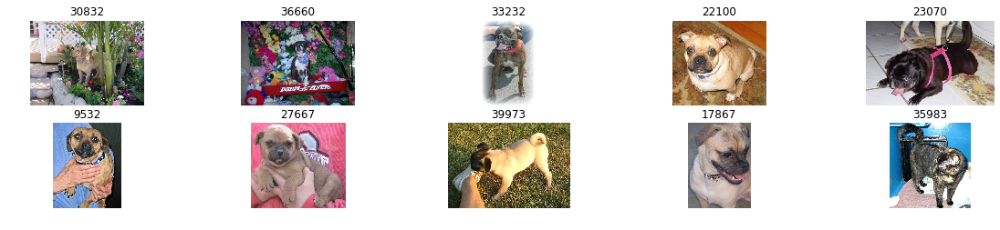

('n02110958', 'pug', 0.8985587)
('n02108422', 'bull_mastiff', 0.064571835)
('n02108089', 'boxer', 0.01253592)
('n02108915', 'French_bulldog', 0.0046946034)
('n02086079', 'Pekinese', 0.0021026796)
('n02112706', 'Brabancon_griffon', 0.0011587237)
('n02096585', 'Boston_bull', 0.0010561992)
('n02086240', 'Shih-Tzu', 0.0006402455)
('n02109047', 'Great_Dane', 0.0005972635)
('n02091467', 'Norwegian_elkhound', 0.00058795954)
('n02098413', 'Lhasa', 0.00051312876)
('n02123045', 'tabby', 0.0004270936)
('n02123159', 'tiger_cat', 0.0004157937)
('n03724870', 'mask', 0.00037949052)
('n02110627', 'affenpinscher', 0.0003722073)
('n02129604', 'tiger', 0.00034661507)
('n01775062', 'wolf_spider', 0.00032926997)
('n02093859', 'Kerry_blue_terrier', 0.00029818143)
('n01768244', 'trilobite', 0.00028942106)
('n01622779', 'great_grey_owl', 0.00027543947)
('n02128757', 'snow_leopard', 0.000262765)
('n03803284', 'muzzle', 0.0002512899)
('n02097209', 'standard_schnauzer', 0.00024403211)
('n04209133', 'shower_cap',

Got 10000 Hits:
10983 dogs-vs-cats/train/dog.10387.jpg 0.9999379
13883 dogs-vs-cats/train/dog.10445.jpg 0.99989283
26951 dogs-vs-cats/train/dog.7573.jpg 0.99989283
36462 dogs-vs-cats/train/dog.6495.jpg 0.9998848
38292 dogs-vs-cats/train/dog.9879.jpg 0.99988335
30887 dogs-vs-cats/train/dog.11432.jpg 0.99987906
34369 dogs-vs-cats/train/dog.12466.jpg 0.9998722
14279 dogs-vs-cats/train/dog.5379.jpg 0.9998699
4003 dogs-vs-cats/train/dog.8402.jpg 0.9998647
45305 dogs-vs-cats/train/dog.11092.jpg 0.9998475


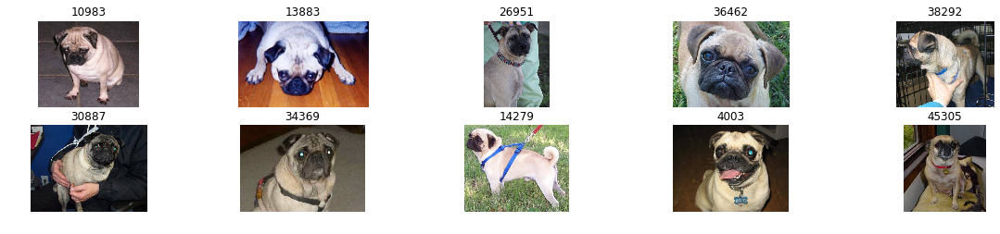

('n02110958', 'pug', 0.29422647)
('n02108422', 'bull_mastiff', 0.1822307)
('n03404251', 'fur_coat', 0.11450598)
('n02109047', 'Great_Dane', 0.05050253)
('n02109525', 'Saint_Bernard', 0.027414136)
('n03803284', 'muzzle', 0.027098652)
('n02108089', 'boxer', 0.022025354)
('n02105162', 'malinois', 0.021759225)
('n02108915', 'French_bulldog', 0.019736275)
('n02089867', 'Walker_hound', 0.017885784)
('n02093428', 'American_Staffordshire_terrier', 0.016525146)
('n02091134', 'whippet', 0.010712177)
('n02091467', 'Norwegian_elkhound', 0.010542555)
('n02096585', 'Boston_bull', 0.007916016)
('n02089973', 'English_foxhound', 0.0073016114)
('n02123597', 'Siamese_cat', 0.0064166067)
('n02457408', 'three-toed_sloth', 0.00601256)
('n02088466', 'bloodhound', 0.005663702)
('n02088364', 'beagle', 0.0054906285)
('n02088632', 'bluetick', 0.0054036924)
('n02056570', 'king_penguin', 0.0052334215)
('n02088238', 'basset', 0.0049223145)
('n02106662', 'German_shepherd', 0.0046736305)
('n02443484', 'black-footed_f

Got 10000 Hits:
34816 dogs-vs-cats/train/dog.6245.jpg 0.9992753
30832 dogs-vs-cats/train/dog.11340.jpg 0.99921376
23070 dogs-vs-cats/train/dog.11992.jpg 0.99920934
34951 dogs-vs-cats/train/dog.530.jpg 0.9991614
27667 dogs-vs-cats/train/dog.4318.jpg 0.99915195
21376 dogs-vs-cats/train/dog.5747.jpg 0.9991369
9532 dogs-vs-cats/train/dog.1756.jpg 0.9990937
42119 dogs-vs-cats/train/dog.4966.jpg 0.9990935
47570 dogs-vs-cats/train/dog.4380.jpg 0.999061
42935 dogs-vs-cats/train/dog.11525.jpg 0.9990599


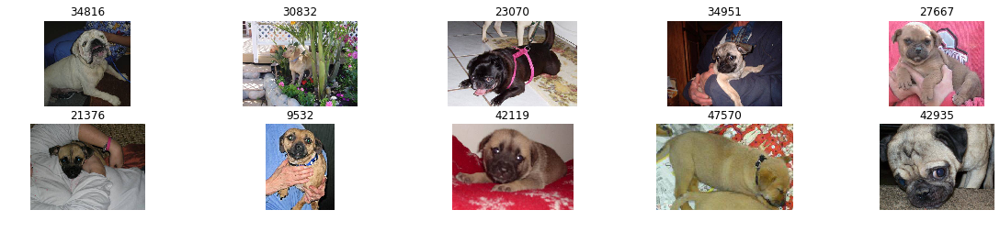

('n02090622', 'borzoi', 0.18928158)
('n02090721', 'Irish_wolfhound', 0.13381878)
('n02109525', 'Saint_Bernard', 0.10067827)
('n02109047', 'Great_Dane', 0.05127942)
('n02108422', 'bull_mastiff', 0.036699)
('n02091831', 'Saluki', 0.036300115)
('n02111129', 'Leonberg', 0.034210347)
('n02116738', 'African_hunting_dog', 0.031227857)
('n02106662', 'German_shepherd', 0.024462301)
('n02089867', 'Walker_hound', 0.02407088)
('n02091467', 'Norwegian_elkhound', 0.019607289)
('n02108551', 'Tibetan_mastiff', 0.01502389)
('n03803284', 'muzzle', 0.014958183)
('n02114367', 'timber_wolf', 0.01210028)
('n02105162', 'malinois', 0.012023595)
('n02104029', 'kuvasz', 0.011448369)
('n02088632', 'bluetick', 0.011346014)
('n02100735', 'English_setter', 0.010814473)
('n02089973', 'English_foxhound', 0.010115723)
('n02111277', 'Newfoundland', 0.008955352)
('n02110958', 'pug', 0.008585479)
('n02092002', 'Scottish_deerhound', 0.008458397)
('n02091635', 'otterhound', 0.0081825415)
('n02088094', 'Afghan_hound', 0.007

Got 10000 Hits:
39454 dogs-vs-cats/train/dog.2468.jpg 0.9992673
17065 dogs-vs-cats/train/cat.44.jpg 0.9990503
8321 dogs-vs-cats/train/dog.5122.jpg 0.999048
47516 dogs-vs-cats/train/dog.2068.jpg 0.9990372
31597 dogs-vs-cats/train/cat.10854.jpg 0.9990356
39453 dogs-vs-cats/train/cat.1423.jpg 0.99903536
2355 dogs-vs-cats/train/dog.12185.jpg 0.9990332
1760 dogs-vs-cats/train/dog.9246.jpg 0.99902815
22325 dogs-vs-cats/train/cat.3886.jpg 0.99902743
9818 dogs-vs-cats/train/cat.10418.jpg 0.99902725


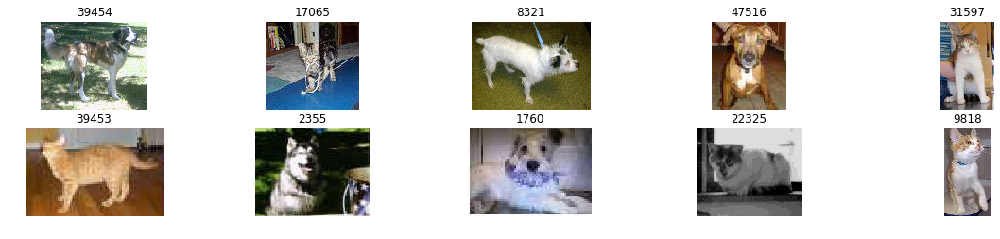

In [736]:
filename = "dogs-vs-cats/train/mini/dog.12466.jpg"
_ = searchimg('image-search-2', filename, 1000, 10, 'man', 1.0, 2)

2 5 1


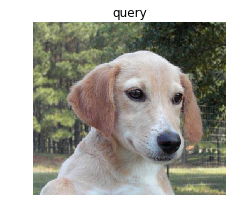

('n02099601', 'golden_retriever', 0.38249564)
('n02099712', 'Labrador_retriever', 0.31220558)

Got 10000 Hits:
232 dogs-vs-cats/train/dog.12423.jpg 0.99998754
22182 dogs-vs-cats/train/dog.3877.jpg 0.99923927
5804 dogs-vs-cats/train/dog.3350.jpg 0.9988224
7087 dogs-vs-cats/train/dog.6416.jpg 0.9970737
29905 dogs-vs-cats/train/dog.2434.jpg 0.9970149
40258 dogs-vs-cats/train/dog.6791.jpg 0.9952559
11001 dogs-vs-cats/train/dog.8834.jpg 0.9950958
28600 dogs-vs-cats/train/dog.7613.jpg 0.9947871
4890 dogs-vs-cats/train/dog.9251.jpg 0.9944117
47747 dogs-vs-cats/train/dog.7058.jpg 0.99424434


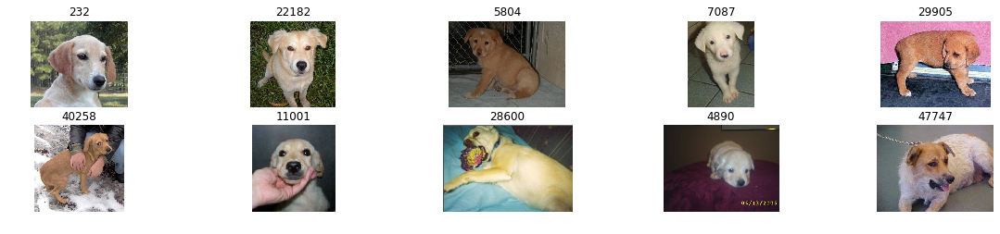

In [806]:
#filename = "dogs-vs-cats/train/mini/dog.12466.jpg"
filename = "dogs-vs-cats/train/mini/dog.12423.jpg"
_ = searchimg('image-search-2', filename, 2, 10, 'var', 1.0, 1)

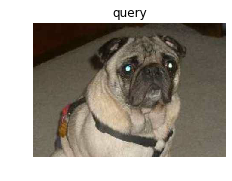

('n02110958', 'pug', 0.83183455)
('n02108422', 'bull_mastiff', 0.07784116)
('n02808304', 'bath_towel', 0.00815668)
('n02098413', 'Lhasa', 0.007912464)
('n02883205', 'bow_tie', 0.004999949)
('n02108915', 'French_bulldog', 0.004577248)
('n04409515', 'tennis_ball', 0.004210775)
('n04209133', 'shower_cap', 0.0033766704)
('n02086240', 'Shih-Tzu', 0.0033179633)
('n02086079', 'Pekinese', 0.003144418)

(0.00000+doc['s.n02110958.s'].value*0.83183455+doc['s.n02108422.s'].value*0.07784116+doc['s.n02808304.s'].value*0.00815668+doc['s.n02098413.s'].value*0.007912464+doc['s.n02883205.s'].value*0.004999949+doc['s.n02108915.s'].value*0.004577248+doc['s.n04409515.s'].value*0.004210775+doc['s.n04209133.s'].value*0.0033766704+doc['s.n02086240.s'].value*0.0033179633+doc['s.n02086079.s'].value*0.003144418)/doc['l2'].value
Got 100 Hits:
169 dogs-vs-cats/train/dog.6766.jpg 0.7947934
189 dogs-vs-cats/train/dog.4171.jpg 0.024075909
128 dogs-vs-cats/train/dog.1747.jpg 0.00798407
153 dogs-vs-cats/train/dog.4617.

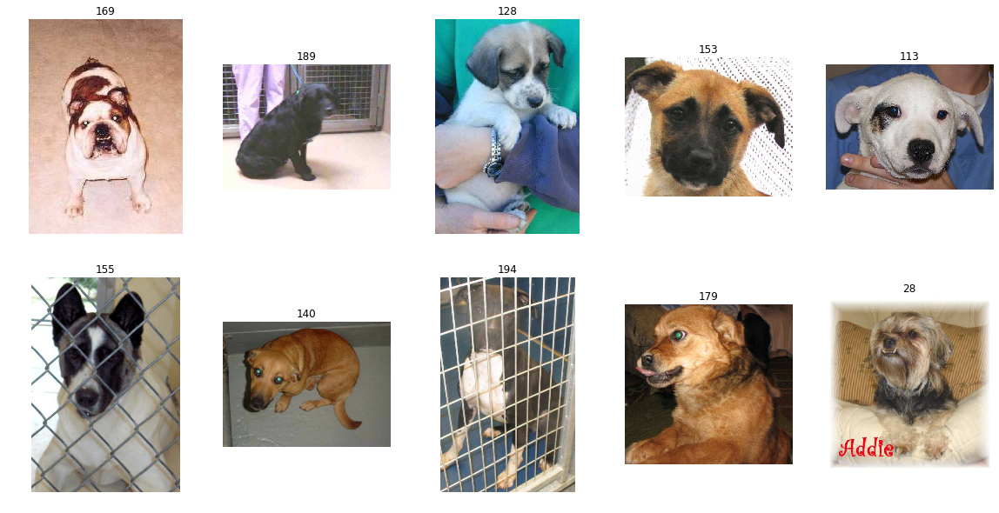

In [483]:
filename = "dogs-vs-cats/train/mini/dog.12466.jpg"
_ = searchimg(filename, 10, 10, 'cos')

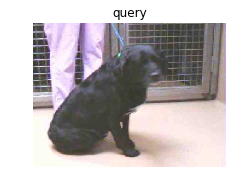

('n02099267', 'flat-coated_retriever', 0.1747775)
('n02097130', 'giant_schnauzer', 0.10911678)
('n02099712', 'Labrador_retriever', 0.08620256)
('n02089078', 'black-and-tan_coonhound', 0.06821089)
('n02099429', 'curly-coated_retriever', 0.043971375)
('n02093256', 'Staffordshire_bullterrier', 0.03973678)
('n02667093', 'abaya', 0.03090445)
('n02097209', 'standard_schnauzer', 0.02726641)
('n02109047', 'Great_Dane', 0.020783713)
('n02108915', 'French_bulldog', 0.020189404)

0.00000+doc['s.n02099267.s'].value*0.1747775+doc['s.n02097130.s'].value*0.10911678+doc['s.n02099712.s'].value*0.08620256+doc['s.n02089078.s'].value*0.06821089+doc['s.n02099429.s'].value*0.043971375+doc['s.n02093256.s'].value*0.03973678+doc['s.n02667093.s'].value*0.03090445+doc['s.n02097209.s'].value*0.02726641+doc['s.n02109047.s'].value*0.020783713+doc['s.n02108915.s'].value*0.020189404
Got 100 Hits:
73 dogs-vs-cats/train/dog.6996.jpg 0.08147824
22 dogs-vs-cats/train/dog.3144.jpg 0.0775798
118 dogs-vs-cats/train/dog.1111

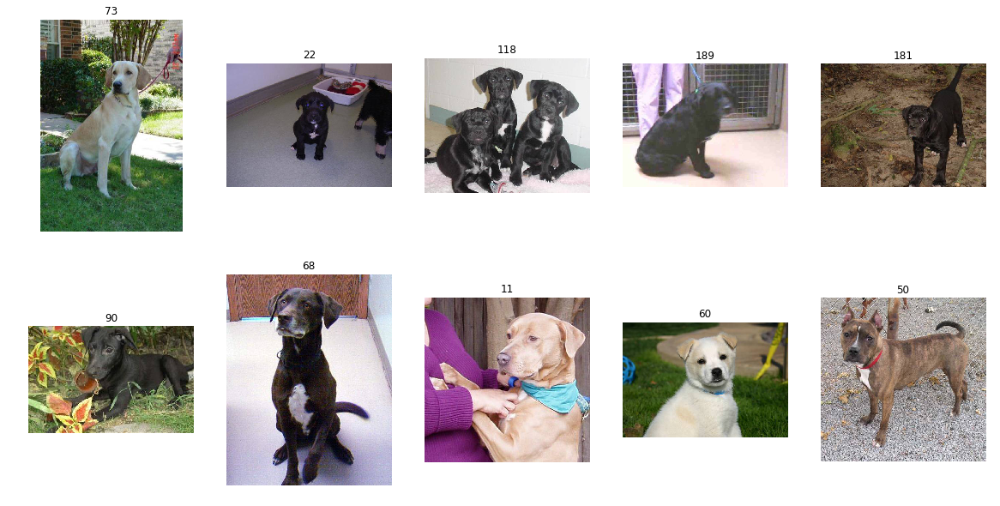

In [484]:
filename = "dogs-vs-cats/train/dog.4171.jpg"
_ = searchimg(filename, 10)

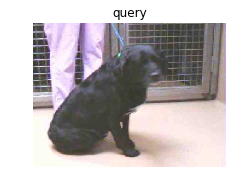

('n02099267', 'flat-coated_retriever', 0.1747775)
('n02097130', 'giant_schnauzer', 0.10911678)
('n02099712', 'Labrador_retriever', 0.08620256)
('n02089078', 'black-and-tan_coonhound', 0.06821089)
('n02099429', 'curly-coated_retriever', 0.043971375)
('n02093256', 'Staffordshire_bullterrier', 0.03973678)
('n02667093', 'abaya', 0.03090445)
('n02097209', 'standard_schnauzer', 0.02726641)
('n02109047', 'Great_Dane', 0.020783713)
('n02108915', 'French_bulldog', 0.020189404)

(0.00000+doc['s.n02099267.s'].value*0.1747775+doc['s.n02097130.s'].value*0.10911678+doc['s.n02099712.s'].value*0.08620256+doc['s.n02089078.s'].value*0.06821089+doc['s.n02099429.s'].value*0.043971375+doc['s.n02093256.s'].value*0.03973678+doc['s.n02667093.s'].value*0.03090445+doc['s.n02097209.s'].value*0.02726641+doc['s.n02109047.s'].value*0.020783713+doc['s.n02108915.s'].value*0.020189404)/doc['l1'].value
Got 100 Hits:
73 dogs-vs-cats/train/dog.6996.jpg 0.08147823
22 dogs-vs-cats/train/dog.3144.jpg 0.0775798
118 dogs-vs-c

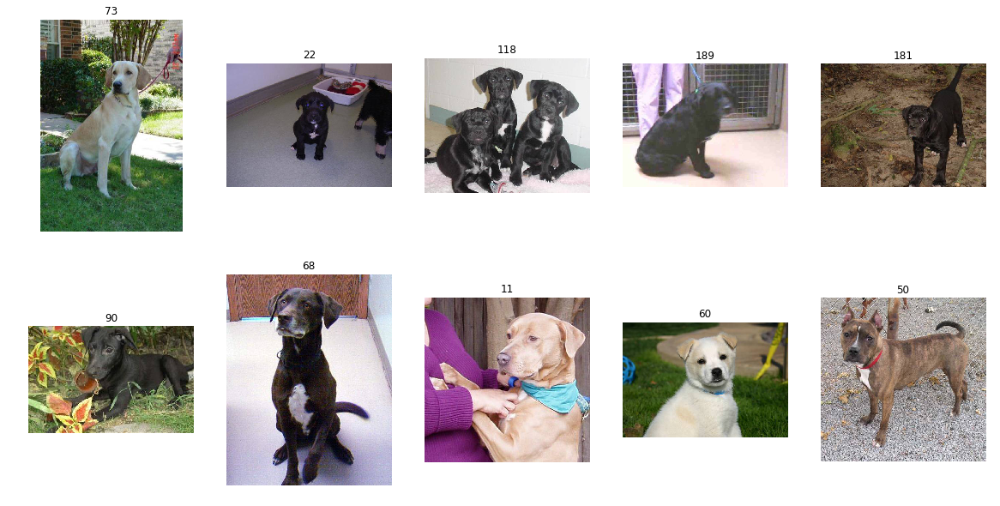

In [485]:
filename = "dogs-vs-cats/train/dog.4171.jpg"
_ = searchimg(filename, 10, 10, 'norm')

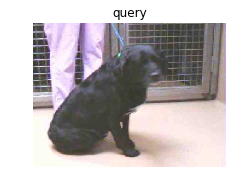

('n02099267', 'flat-coated_retriever', 0.1747775)
('n02097130', 'giant_schnauzer', 0.10911678)
('n02099712', 'Labrador_retriever', 0.08620256)
('n02089078', 'black-and-tan_coonhound', 0.06821089)
('n02099429', 'curly-coated_retriever', 0.043971375)
('n02093256', 'Staffordshire_bullterrier', 0.03973678)
('n02667093', 'abaya', 0.03090445)
('n02097209', 'standard_schnauzer', 0.02726641)
('n02109047', 'Great_Dane', 0.020783713)
('n02108915', 'French_bulldog', 0.020189404)

(0.00000+doc['s.x7d.s'].value*0.1747775+doc['s.x62.s'].value*0.10911678+doc['s.x4.s'].value*0.08620256+doc['s.xd4.s'].value*0.06821089+doc['s.x12f.s'].value*0.043971375+doc['s.x23.s'].value*0.03973678+doc['s.x287.s'].value*0.03090445+doc['s.x127.s'].value*0.02726641+doc['s.x2b.s'].value*0.020783713+doc['s.x37.s'].value*0.020189404)/doc['l2'].value
Got 100 Hits:
168 dogs-vs-cats/train/cat.4433.jpg 0.027596064
177 dogs-vs-cats/train/dog.1009.jpg 0.026284589
17 dogs-vs-cats/train/cat.8553.jpg 0.025722604
163 dogs-vs-cats/tr

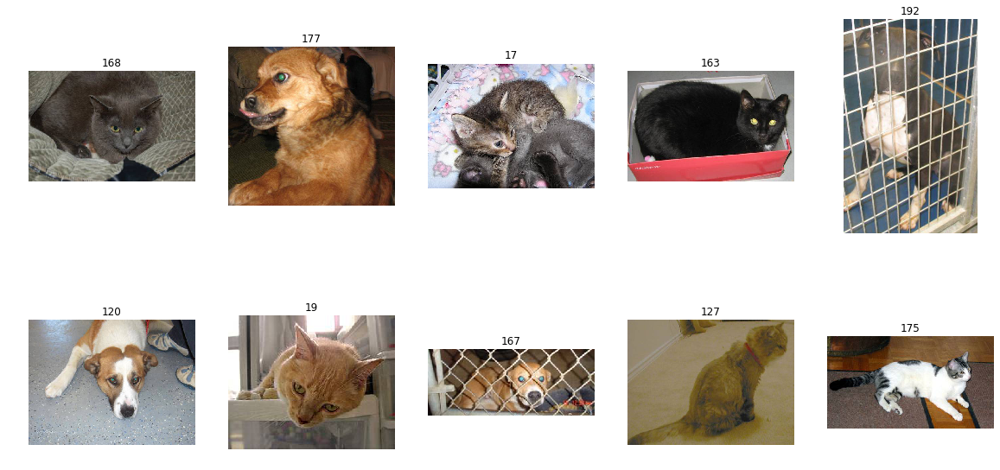

In [566]:
filename = "dogs-vs-cats/train/dog.4171.jpg"
_ = searchimg(filename, 10, 10, 'cos')

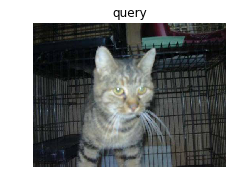

('n02124075', 'Egyptian_cat', 0.9023587)
('n02123159', 'tiger_cat', 0.041632026)
('n02123045', 'tabby', 0.031916577)
('n02127052', 'lynx', 0.019250317)
('n04589890', 'window_screen', 0.0028396521)
('n04590129', 'window_shade', 0.000225419)
('n04040759', 'radiator', 0.00021725729)
('n04265275', 'space_heater', 0.00015602024)
('n03207941', 'dishwasher', 0.000110677014)
('n02123394', 'Persian_cat', 9.403487e-05)

Got 100 Hits:
168 dogs-vs-cats/train/cat.4433.jpg 0.00081546383
29 dogs-vs-cats/train/cat.6218.jpg 0.000696117
105 dogs-vs-cats/train/cat.7674.jpg 0.00041009687
134 dogs-vs-cats/train/dog.6028.jpg 0.0002777769
127 dogs-vs-cats/train/cat.10145.jpg 0.00025691703
154 dogs-vs-cats/train/cat.6542.jpg 0.00024667432
18 dogs-vs-cats/train/cat.8553.jpg 0.00024551817
175 dogs-vs-cats/train/cat.11515.jpg 0.00024272845
190 dogs-vs-cats/train/dog.4171.jpg 0.00019775156
66 dogs-vs-cats/train/cat.946.jpg 0.00017783596


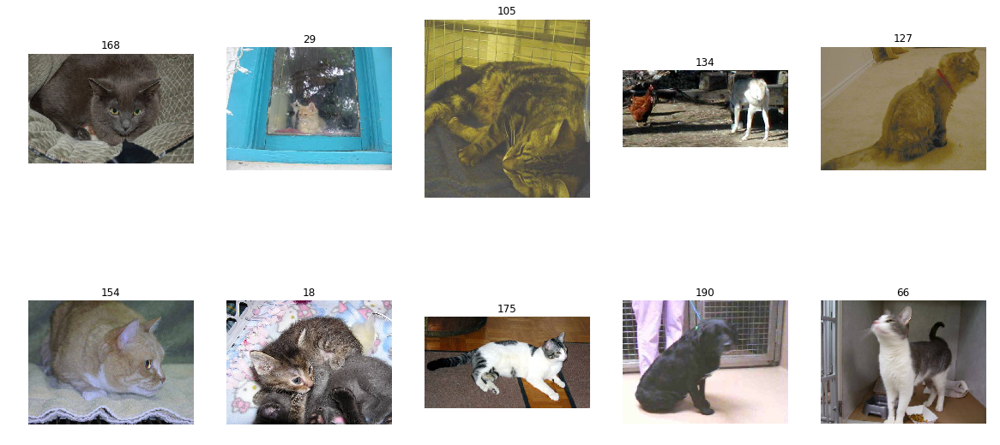

In [447]:
filename = "dogs-vs-cats/train/cat.11111.jpg"
_ = searchimg(filename, 10, 10, 'dot')

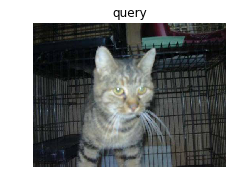

('n02124075', 'Egyptian_cat', 0.9023587)
('n02123159', 'tiger_cat', 0.041632026)
('n02123045', 'tabby', 0.031916577)
('n02127052', 'lynx', 0.019250317)
('n04589890', 'window_screen', 0.0028396521)
('n04590129', 'window_shade', 0.000225419)
('n04040759', 'radiator', 0.00021725729)
('n04265275', 'space_heater', 0.00015602024)
('n03207941', 'dishwasher', 0.000110677014)
('n02123394', 'Persian_cat', 9.403487e-05)

Got 100 Hits:
168 dogs-vs-cats/train/cat.4433.jpg 0.00081546383
29 dogs-vs-cats/train/cat.6218.jpg 0.00069611706
105 dogs-vs-cats/train/cat.7674.jpg 0.0004100969
134 dogs-vs-cats/train/dog.6028.jpg 0.0002777769
127 dogs-vs-cats/train/cat.10145.jpg 0.00025691706
154 dogs-vs-cats/train/cat.6542.jpg 0.00024667435
18 dogs-vs-cats/train/cat.8553.jpg 0.00024551817
175 dogs-vs-cats/train/cat.11515.jpg 0.00024272846
190 dogs-vs-cats/train/dog.4171.jpg 0.00019775156
66 dogs-vs-cats/train/cat.946.jpg 0.00017783593


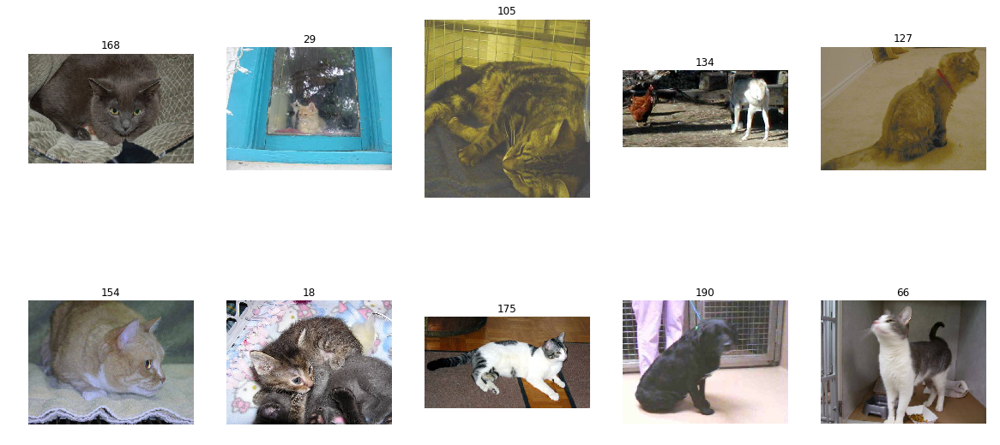

In [448]:
filename = "dogs-vs-cats/train/cat.11111.jpg"
_ = searchimg(filename, 10, 10, 'norm')

2 5 1


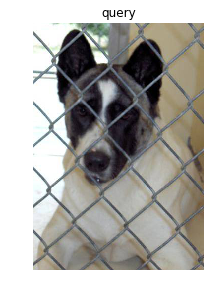

('n02113186', 'Cardigan', 0.15790789)

Got 10000 Hits:
4656 dogs-vs-cats/train/dog.8199.jpg 0.15786307
49459 dogs-vs-cats/train/cat.5536.jpg 0.15779313
14158 dogs-vs-cats/train/dog.4098.jpg 0.15690653
22703 dogs-vs-cats/train/dog.459.jpg 0.15684249
34551 dogs-vs-cats/train/cat.7627.jpg 0.15682098
21764 dogs-vs-cats/train/cat.1507.jpg 0.1555351
4215 dogs-vs-cats/train/cat.7298.jpg 0.15543483
23887 dogs-vs-cats/train/dog.10455.jpg 0.15536103
18327 dogs-vs-cats/train/dog.3333.jpg 0.15532906
45158 dogs-vs-cats/train/cat.801.jpg 0.15525748


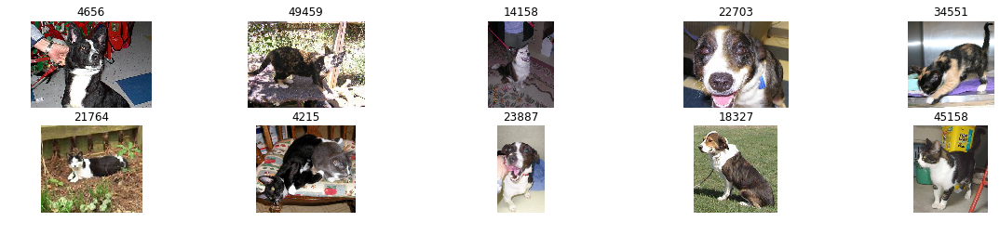

In [685]:
filename = "dogs-vs-cats/train/mini/dog.12437.jpg"
_ = searchimg("image-search-2", filename, 1, 10, 'cos', 1.0)

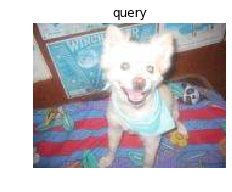

('n02085620', 'Chihuahua', 0.42014658)
('n02113978', 'Mexican_hairless', 0.22689928)
('n02098286', 'West_Highland_white_terrier', 0.06954366)
('n02395406', 'hog', 0.02262779)
('n02445715', 'skunk', 0.019537875)
('n02105412', 'kelpie', 0.013392485)
('n02096294', 'Australian_terrier', 0.010522679)
('n02091244', 'Ibizan_hound', 0.008986346)
('n02086910', 'papillon', 0.008091388)
('n02123597', 'Siamese_cat', 0.0071810046)
('n02091032', 'Italian_greyhound', 0.0069966586)
('n02966193', 'carousel', 0.0067779287)
('n02093428', 'American_Staffordshire_terrier', 0.006722963)
('n02087046', 'toy_terrier', 0.0062257675)
('n02110341', 'dalmatian', 0.0059363623)
('n03026506', 'Christmas_stocking', 0.005179375)
('n02100735', 'English_setter', 0.0051222416)
('n02101388', 'Brittany_spaniel', 0.004875594)
('n02112018', 'Pomeranian', 0.0045278394)
('n04462240', 'toyshop', 0.0042104223)
('n02093256', 'Staffordshire_bullterrier', 0.0035797446)
('n02113624', 'toy_poodle', 0.0034987312)
('n02107312', 'miniatu

Got 10000 Hits:
3 dogs-vs-cats/train/dog.7322.jpg 0.484509
37387 dogs-vs-cats/train/dog.5215.jpg 0.46200675
23223 dogs-vs-cats/train/dog.8665.jpg 0.45100826
15183 dogs-vs-cats/train/dog.8271.jpg 0.44740564
46865 dogs-vs-cats/train/dog.1985.jpg 0.44657698
48626 dogs-vs-cats/train/dog.11721.jpg 0.44001082
29535 dogs-vs-cats/train/dog.10315.jpg 0.4386234
21315 dogs-vs-cats/train/dog.5035.jpg 0.43819973
20762 dogs-vs-cats/train/dog.9960.jpg 0.43201786
28678 dogs-vs-cats/train/dog.7161.jpg 0.43187827


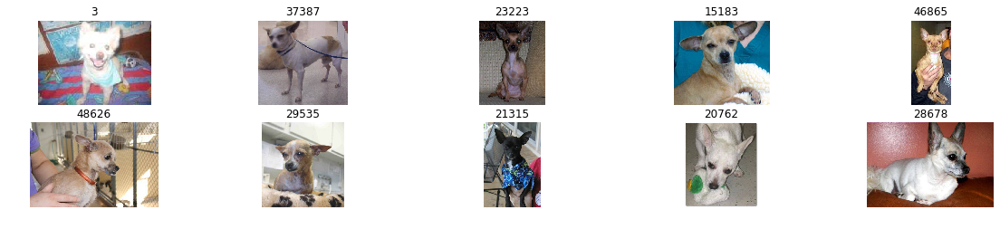

In [888]:
filename = "dogs-vs-cats/train/dog.7322.jpg"
_ = searchimg(filename, 1000, 10, 'cos', 1.0)

In [9]:
import time
import queue

def searchrank(indexname, filename, num=10, topk=10, scoretype='dot', scale=1.0, partition=1):
    reslist = predictpart(filename, num, scale, partition)
    searchlist = []
    for synsets in reslist:
        start = time.time()
        _type = scoretype
        if scoretype == '+cos':
            _type = 'dot'
        res = search(indexname, synsets, num, topk, _type, False)
        elapsed_time = time.time() - start
        topres = res['hits']['hits'][0:topk]
        count = 0
        score = 0
        hits = 0
        if scoretype == '+cos':
            class Job(object):
                def __init__(self, score, _fn, _id):
                    self.score = score
                    self._fn = _fn
                    self._id = _id
                    return
                def __lt__(self, other):
                    return self.score > other.score
    
            q = queue.PriorityQueue(topk)
            for i in range(len(topres)):
                hit = topres[i]
                _fn = hit["_source"]["f"]
                _id = hit["_id"]
                results = predict(_fn, num) 
                #L1 = float(0)
                L2 = float(0)
                #score1 = float(0)
                score2 = float(0)
                for j in range(len(synsets)):
                    x = synsets[j][2]
                    y = float(str(results[j][2]))
                    #score1 = score1 + abs(y - x)
                    score2 = score2 + x * y
                    #l1 = l1 + score
                    L2 = L2 + y ** 2
                score2 = score2 / L2
                q.put(Job(score2, _fn, _id))
                
            elapsed_time = time.time() - start
            while not q.empty():
                count += 1
                next_job = q.get()
                _, f1 = os.path.split(next_job._fn)
                _, f2 = os.path.split(filename)
                if f1 == f2:
                    score = hit["_score"]
                    hits += 1
                    break
                #print(str(next_job._id) + " " + str(next_job._fn) + " " + str(next_job.score))
        else:
            for hit in topres:
                count += 1
                _, f1 = os.path.split(hit["_source"]["f"])
                _, f2 = os.path.split(filename)
                if f1 == f2:
                    score = hit["_score"]
                    hits += 1
                    break
        searchlist.append((count, score, hits, elapsed_time))
    return searchlist

def evaluate(indexname, num=10, topk=10, scoretype='dot', limit=30000, scale=1.0, partition=1):
    directory = "dogs-vs-cats/train/mini/"
    imagefiles = loadimages(directory)
    total = 0
    totaltime = 0
    hitcount = 0
    mnap = 0
    ndcg = 0
    for i in range(len(imagefiles)):
        if i >= limit: 
            break
        filename = imagefiles[i]
        searchlist = searchrank(indexname, filename, num, topk, scoretype, scale, partition)
        #print(searchlist)
        for count, score, hits, time in searchlist:
            totaltime += time
            hitcount += hits
            total += 1
            if hits > 0:
                prec = float(1 / count)
                mnap += prec / hits
                dcg = float(score) / math.log2(count + 1)
                ndcg += dcg
            sys.stdout.write("\r%d" % total)
            sys.stdout.flush()
    mnap = mnap / total
    idcg = 1.0 / math.log2(2) * total
    ndcg = ndcg / idcg
    return mnap, ndcg, hitcount / total, totaltime / total
    

In [13]:
test('image-search-2', 'dot', [1000], 100, 10, 1.0, 1)

#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
dot,1000,100,1.0,1,0.052367613712151526,0.04588362218154492,0.4,2.5998284339904787


In [94]:
test('image-search-2', '+cos', [1000], 100, 10, 1.0, 1)

#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
+cos,1000,100,1.0,1,0.07784134248665141,0.017919799186069497,0.4,43.72224276065826


In [74]:
filename = "dogs-vs-cats/train/dog.7322.jpg"
searchrank('image-search-2', filename, 1000, 100, 'dot')

[(100, 0, 0, 2.664649248123169)]

In [703]:
evallist = evaluate('image-search-2', 1, 10, 'cos', 10, 1.0, 1)
sys.stdout.write("\r")
sys.stdout.flush()
print(evallist)

(0.03857142857142857, 0.052740230417412305, 0.3, 0.03747789859771729)


In [16]:
!curl -XPUT http://localhost:9200/_cluster/settings -H "Content-Type: application/json" -d ' \
{ \
  "transient": { \
    "script.max_compilations_rate": "150/1m" \
  } \
} \
'

{"acknowledged":true,"persistent":{},"transient":{"script":{"max_compilations_rate":"150/1m"}}}

In [11]:
#test
def test(indexname, scripttype='dot', featurenum=[100], topk=100, limit=30000, scale=1.0, partition=1):
    print('#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time')
    for num in featurenum:
        stype = scripttype
        mnap, ndcg, hitrate, time = evaluate(indexname, num, topk, stype, limit, scale, partition)
        sys.stdout.write("\r")
        sys.stdout.flush()
        print(stype + ',' + str(num) + ',' + str(topk) + ',' + str(scale) + ',' + str(partition) + ',' + str(mnap) + ',' + str(ndcg) + ',' + str(hitrate) + ',' + str(time))


In [607]:
testsize = 10

for scripttype in ['dot', 'cos']:
    for scale in [1.0, 0.8, 0.6, 0.4, 0.2]:
        for topk in [10, 100, 1000]:
            featurenum = [1, 2, 3, 4, 5, 10, 20, 30, 40, 50, 100, 200, 300, 400, 500, 1000]
            test('image-search', scripttype, featurenum, topk, testsize, scale)


#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
dot,1,10,1.0,1,0.02777777777777778,0.03198029919453448,0.2,0.04084701538085937
dot,2,10,1.0,1,0.03611111111111111,0.03405835289086777,0.2,0.04053075313568115
dot,3,10,1.0,1,0.03611111111111111,0.03476981647070852,0.2,0.04878487586975098
dot,4,10,1.0,1,0.03611111111111111,0.03496324542341781,0.2,0.05688457489013672
dot,5,10,1.0,1,0.03611111111111111,0.035140859507561226,0.2,0.06222231388092041
dot,10,10,1.0,1,0.04444444444444444,0.036377319092703655,0.2,0.12449378967285156
dot,20,10,1.0,1,0.04444444444444444,0.03639953960300361,0.2,0.3384662628173828
dot,30,10,1.0,1,0.04444444444444444,0.03640181710300361,0.2,0.2984475135803223
7

KeyboardInterrupt: 

In [548]:
def sqrttest(filename, featuresize=1000):
    rounddown = 16
    doc = {'f': filename, 's':{}}  # filename, synset
    results = predict(filename, featuresize) 
    l1 = float(0)
    l2 = float(0)
    for result in results:
        score = float(str(result[2]))
        l1 = l1 + score
        l2 = l2 + score ** 2
    for result in results:
        score = float(str(result[2]))
        synset = doc['s']
        #wnid = int(result[0][1:])
        wnid = result[0]
        #dictionary[wnid] = hex(wnid[1:])[1:]
        id = str(hex(int(wnid[1:])-2000000)[2:])
        synset[id] = {
            'i': wnid,     # wnid
            'w': result[1],   # words
            's': round(score, rounddown),         # score
            's1': round(score / math.sqrt(l1), rounddown),         # L1 score
            's2': round(score / math.sqrt(l2), rounddown)         # L2 score
        }
    doc['l1'] = round(math.sqrt(l1), rounddown)
    doc['l2'] = math.sqrt(l2)
    print(math.sqrt(l1))
    #print(synset)
    
sqrttest('dogs-vs-cats/train/dog.7322.jpg')

0.999999945185588


In [72]:
test('image-search-2', '+cos', [1], 10, 10, 1.0, 1)

#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
x:0.15790789, y:0.9333104
x:0.15790789, y:0.8530225
x:0.15790789, y:0.7388255
x:0.15790789, y:0.71729857
x:0.15790789, y:0.69671893
x:0.15790789, y:0.68862706
x:0.15790789, y:0.6829408
x:0.15790789, y:0.67061
x:0.15790789, y:0.66376346
x:0.15790789, y:0.65994406
33439 dogs-vs-cats/train/dog.7777.jpg 0.23927465654174734
14158 dogs-vs-cats/train/dog.4098.jpg 0.23789783229897335
34551 dogs-vs-cats/train/cat.7627.jpg 0.23546903310905934
26258 dogs-vs-cats/train/dog.7214.jpg 0.23121753495071065
22703 dogs-vs-cats/train/dog.459.jpg 0.22930828232812447
21764 dogs-vs-cats/train/cat.1507.jpg 0.22664503789679766
38072 dogs-vs-cats/train/cat.4610.jpg 0.220142483057322
18327 dogs-vs-cats/train/dog.3333.jpg 0.21372825964083034
49459 dogs-vs-cats/train/cat.5536.jpg 0.18511573644688892
4656 dogs-vs-cats/train/dog.8199.jpg 0.16919118044036185
1x:0.38249564, y:0.959724
x:0.38249564, y:0.95439

In [835]:
test('image-search-2', 'var', [100], 10, 10, 0.4, 1)

#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
var,100,10,0.4,1,0.145,0.13821134216950057,0.3,1.3969874382019043


In [614]:
testsize = 10

for scripttype in ['dot', 'man', 'var', 'cos']:
    for part in [1, 2, 3]:
        for scale in [1.0, 0.8, 0.6]:
            for topk in [10, 100, 1000]:
                featurenum = [1, 2, 3, 4, 5, 10, 20, 30, 40, 50, 100, 200, 300, 400, 500, 1000]
                test('image-search-2', scripttype, featurenum, topk, testsize, scale, part)


#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
dot,1,10,1.0,1,0.02777777777777778,0.03198029919453448,0.2,0.0313685417175293
dot,2,10,1.0,1,0.03611111111111111,0.03405835289086777,0.2,0.03807840347290039
dot,3,10,1.0,1,0.03611111111111111,0.03476981647070852,0.2,0.04543650150299072
dot,4,10,1.0,1,0.03611111111111111,0.03496324542341781,0.2,0.052830862998962405
dot,5,10,1.0,1,0.03611111111111111,0.035140859507561226,0.2,0.06588683128356934
dot,10,10,1.0,1,0.04444444444444444,0.036377319092703655,0.2,0.028624629974365233
dot,20,10,1.0,1,0.04444444444444444,0.03639953960300361,0.2,0.323119592666626
dot,30,10,1.0,1,0.04444444444444444,0.03640181710300361,0.2,0.32807939052581786
dot,40,10,1.0,1,0.04444444444444444,0.03640252810300361,0.2,0.38010871410369873
dot,50,10,1.0,1,0.04444444444444444,0.03640280910300361,0.2,0.4344319343566895
dot,100,10,1.0,1,0.04444444444444444,0.036403140103003606,0.2,0.6018534898757935
dot,200,10,1

dot,500,1000,0.8,1,0.05423729415611046,0.0558146254077088,0.8,6.658111715316773
dot,1000,1000,0.8,1,0.05423729415611046,0.055814626449586825,0.8,4.891365051269531
#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
dot,1,10,0.6,1,0.02777777777777778,0.03198029919453448,0.2,0.040370392799377444
dot,2,10,0.6,1,0.03611111111111111,0.03405835289086777,0.2,0.05486211776733398
dot,3,10,0.6,1,0.03611111111111111,0.03476981647070852,0.2,0.06809308528900146
dot,4,10,0.6,1,0.03611111111111111,0.03496324542341781,0.2,0.07895886898040771
dot,5,10,0.6,1,0.03611111111111111,0.035140859507561226,0.2,0.10969724655151367
dot,10,10,0.6,1,0.04444444444444444,0.036377319092703655,0.2,0.2077538013458252
dot,20,10,0.6,1,0.04444444444444444,0.03639953960300361,0.2,0.4807681322097778
dot,30,10,0.6,1,0.04444444444444444,0.03640181710300361,0.2,0.4811063051223755
dot,40,10,0.6,1,0.04444444444444444,0.03640252810300361,0.2,0.5619187355041504
dot,50,10,0

KeyboardInterrupt: 

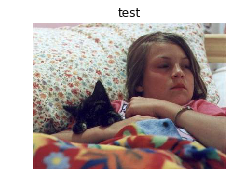

In [477]:
def showpartimg(filename, title, i, size, scale=1.0, col=2, row=5):
    im = Image.open(filename)
    width, height = im.size
    im = im.resize((int(width * scale), int(height * scale)))
    #im = im.resize((width, height))
    im = im.resize((width * size, height * size))
    im_list = np.asarray(im)
    
    out_img = []
    if size > 1: 
        v_split = size
        h_split = size
        [out_img.extend(np.hsplit(h_img, h_split)) for h_img in np.vsplit(im_list, v_split)]
    
    for offset in range(size * size):
        im_list = out_img[offset] if size > 1 else im_list
        pos = i + offset
        plt.subplot(col, row, pos)
        plt.title(title)
        plt.axis("off")
        plt.imshow(im_list)
    
scale = 1.0
filename = "dogs-vs-cats/train/mini/cat.6.jpg"
plt.figure(figsize=(20, 10))
showpartimg(filename, 'test', 1, 1, scale)
showimg(filename, 'test', 1, scale)
plt.show()


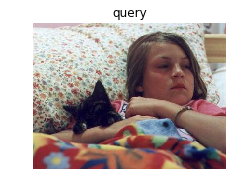

In [473]:
scale = 1.0
filename = "dogs-vs-cats/train/mini/cat.6.jpg"
plt.figure(figsize=(20, 10))
for i in range(1):
    showimg(filename, "query", i+1, scale)

2 5 1


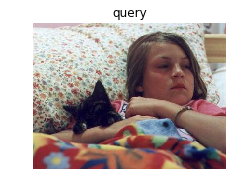

In [683]:
scale = 1.0
filename = "dogs-vs-cats/train/mini/cat.6.jpg"
plt.figure(figsize=(20, 10))
for i in range(1):
    showpartimg(filename, "query", i+1, 1, scale)

In [615]:
testsize = 10

for scripttype in ['dot']:
    for part in [1]:
        for scale in [1.0, 0.8, 0.6]:
            for topk in [10, 100, 1000]:
                featurenum = [1, 2, 3, 4, 5, 10, 20, 30, 40, 50, 100, 200, 400, 1000]
                test('image-search-2', scripttype, featurenum, topk, testsize, scale, part)


#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
dot,1,10,1.0,1,0.02777777777777778,0.03198029919453448,0.2,0.02207489013671875
dot,2,10,1.0,1,0.03611111111111111,0.03405835289086777,0.2,0.027840065956115722
dot,3,10,1.0,1,0.03611111111111111,0.03476981647070852,0.2,0.037878775596618654
dot,4,10,1.0,1,0.03611111111111111,0.03496324542341781,0.2,0.04166109561920166
dot,5,10,1.0,1,0.03611111111111111,0.035140859507561226,0.2,0.09274032115936279
dot,10,10,1.0,1,0.04444444444444444,0.036377319092703655,0.2,0.1656268358230591
dot,20,10,1.0,1,0.04444444444444444,0.03639953960300361,0.2,0.465716814994812
dot,30,10,1.0,1,0.04444444444444444,0.03640181710300361,0.2,0.13548679351806642
dot,40,10,1.0,1,0.04444444444444444,0.03640252810300361,0.2,0.49906306266784667
dot,50,10,1.0,1,0.04444444444444444,0.03640280910300361,0.2,0.5894765377044677
dot,100,10,1.0,1,0.04444444444444444,0.036403140103003606,0.2,0.8450688600540162
dot,200,10,1

dot,50,10,0.6,1,0.04444444444444444,0.03640280910300361,0.2,0.3311823606491089
dot,100,10,0.6,1,0.04444444444444444,0.036403140103003606,0.2,0.6952202081680298
dot,200,10,0.6,1,0.04444444444444444,0.03640317210300361,0.2,1.1904073476791381
dot,400,10,0.6,1,0.04444444444444444,0.03640317210300361,0.2,1.9781301021575928
dot,1000,10,0.6,1,0.04444444444444444,0.03640317210300361,0.2,2.316198945045471
#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
dot,1,100,0.6,1,0.033660130718954254,0.037341324630787584,0.3,0.2350620985031128
dot,2,100,0.6,1,0.043779178338001865,0.04288665787838075,0.4,0.25699491500854493
dot,3,100,0.6,1,0.04388025650511777,0.04388295628454651,0.4,0.24919867515563965
dot,4,100,0.6,1,0.0442479035639413,0.04430881499879463,0.4,0.25686419010162354
dot,5,100,0.6,1,0.04440192743764172,0.044622248879827416,0.4,0.2640537738800049
dot,10,100,0.6,1,0.052735260770975054,0.04594046896995022,0.4,0.27326552867889403
dot,2

KeyboardInterrupt: 

In [616]:
testsize = 10

for scripttype in ['dot']:
    for part in [2, 3]:
        for scale in [1.0, 0.8, 0.6]:
            for topk in [10, 100, 1000]:
                featurenum = [1, 2, 3, 4, 5, 10, 20, 30, 40, 50, 100, 200, 400, 1000]
                test('image-search-2', scripttype, featurenum, topk, testsize, scale, part)


#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
dot,1,10,1.0,2,0.0027777777777777775,0.007026088263596628,0.025,0.07006090879440308
dot,2,10,1.0,2,0.0027777777777777775,0.007026193624095111,0.025,0.058760839700698855
dot,3,10,1.0,2,0.0027777777777777775,0.007026391852347255,0.025,0.051490068435668945
dot,4,10,1.0,2,0.0027777777777777775,0.00702661431351405,0.025,0.05702428817749024
dot,5,10,1.0,2,0.0027777777777777775,0.00702661581866403,0.025,0.06379690170288085
dot,10,10,1.0,2,0.0027777777777777775,0.007026627107288866,0.025,0.11094990968704224
dot,20,10,1.0,2,0.0027777777777777775,0.007026630493876318,0.025,0.33056720495224
dot,30,10,1.0,2,0.0027777777777777775,0.007026631396966304,0.025,0.2708882451057434
dot,40,10,1.0,2,0.0027777777777777775,0.007026631396966304,0.025,0.38376657366752626
dot,50,10,1.0,2,0.0027777777777777775,0.007026631396966304,0.025,0.29958916902542115
dot,100,10,1.0,2,0.0027777777777777775,0.007026

dot,10,10,0.6,2,0.0027777777777777775,0.007026627107288866,0.025,0.06403577327728271
dot,20,10,0.6,2,0.0027777777777777775,0.007026630493876318,0.025,0.10922234654426574
dot,30,10,0.6,2,0.0027777777777777775,0.007026631396966304,0.025,0.17502138614654542
dot,40,10,0.6,2,0.0027777777777777775,0.007026631396966304,0.025,0.23945025801658631
dot,50,10,0.6,2,0.0027777777777777775,0.007026631396966304,0.025,0.30353023409843444
dot,100,10,0.6,2,0.0027777777777777775,0.007026631396966304,0.025,0.8564602196216583
dot,200,10,0.6,2,0.0027777777777777775,0.007026631396966304,0.025,1.552163004875183
dot,400,10,0.6,2,0.0027777777777777775,0.007026631396966304,0.025,3.04683433175087
dot,1000,10,0.6,2,0.0027777777777777775,0.007026631396966304,0.025,3.645547938346863
#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
dot,1,100,0.6,2,0.004968253968253968,0.007375666859948578,0.075,0.2354954957962036
dot,2,100,0.6,2,0.004645424836601307,0.0083

dot,3,100,0.8,3,0.00041152263374485596,3.974530988640444e-05,0.011111111111111112,0.21519208484225802
dot,4,100,0.8,3,0.0005322955806047593,5.048342055657174e-05,0.022222222222222223,0.2226604249742296
dot,5,100,0.8,3,0.0005322955806047593,5.052081593952292e-05,0.022222222222222223,0.23101266225179037
dot,10,100,0.8,3,0.0005246913580246914,6.679347836831235e-05,0.022222222222222223,0.28485852612389456
dot,20,100,0.8,3,0.0005026455026455026,6.62826610323997e-05,0.022222222222222223,0.39851820203993055
dot,30,100,0.8,3,0.0005065985525755641,6.673270427338443e-05,0.022222222222222223,0.5077888833151923
dot,40,100,0.8,3,0.0005026160754748074,6.664503989284338e-05,0.022222222222222223,0.6079154809316
dot,50,100,0.8,3,0.000516299709848097,6.762179987242564e-05,0.022222222222222223,0.7091832637786866
dot,100,100,0.8,3,0.0005001008267795927,6.770368261830268e-05,0.022222222222222223,1.3191676749123467
dot,200,100,0.8,3,0.0005113729340533463,6.852090889096484e-05,0.022222222222222223,2.34162274

KeyboardInterrupt: 

In [ ]:
testsize = 10

for scripttype in ['dot']:
    for part in [3]:
        for scale in [0.6]:
            for topk in [1000]:
                featurenum = [1, 2, 3, 4, 5, 10, 20, 30, 40, 50, 100, 200, 400, 1000]
                test('image-search-2', scripttype, featurenum, topk, testsize, scale, part)


In [626]:
testsize = 10

for scripttype in ['man']:
    for part in [1]#, 2]:#, 3]:
        for scale in [1.0, 0.8, 0.6]:
            for topk in [10, 100, 1000]:
                featurenum = [1, 2, 3, 4, 5, 10, 20, 30, 40, 50, 100, 200, 400, 1000]
                test('image-search-2', scripttype, featurenum, topk, testsize, scale, part)


#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
man,1,10,1.0,1,0.95,0.9630753374540019,1.0,0.02962193489074707
man,2,10,1.0,1,1.0,0.999978319,1.0,0.0308687686920166
man,3,10,1.0,1,1.0,0.9998779729999999,1.0,0.029318881034851075
man,4,10,1.0,1,1.0,0.99997811,1.0,0.030754804611206055
man,5,10,1.0,1,1.0,0.999976152,1.0,0.03649876117706299
man,10,10,1.0,1,1.0,0.9999745969999999,1.0,0.044579362869262694
man,20,10,1.0,1,1.0,0.999973983,1.0,0.14630296230316162
man,30,10,1.0,1,1.0,0.9989756209999999,1.0,0.2694965124130249
man,40,10,1.0,1,1.0,0.9999763249999999,1.0,0.42938642501831054
man,50,10,1.0,1,1.0,0.9999761979999999,1.0,0.5377249240875244
man,100,10,1.0,1,1.0,0.999978095,1.0,0.699661660194397
man,200,10,1.0,1,1.0,0.9999818119999999,1.0,1.426478123664856
man,400,10,1.0,1,1.0,0.999987069,1.0,1.8895956754684449
man,1000,10,1.0,1,1.0,0.999994132,1.0,2.2899872064590454
#script type, feature num, document top k, image scale, parti

man,50,1000,0.6,1,1.0,0.9999761979999999,1.0,2.921254539489746
man,100,1000,0.6,1,1.0,0.999978095,1.0,3.026147651672363
man,200,1000,0.6,1,1.0,0.9999818119999999,1.0,4.052784156799317
man,400,1000,0.6,1,1.0,0.999987069,1.0,4.735001182556152
man,1000,1000,0.6,1,1.0,0.999994132,1.0,5.28002097606659
#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
man,1,10,1.0,2,0.0035714285714285713,0.007955005,0.025,0.03371855616569519
man,2,10,1.0,2,0.0035714285714285713,0.008078082916666667,0.025,0.038307851552963255
man,3,10,1.0,2,0.011904761904761904,0.019511327916666665,0.05,0.04213680624961853
man,4,10,1.0,2,0.0125,0.020283728985669137,0.05,0.04176145195960999
man,5,10,1.0,2,0.0125,0.020416809474682367,0.05,0.0576702356338501
man,10,10,1.0,2,0.005,0.009588874110585715,0.025,0.06340503096580505
man,20,10,1.0,2,0.005,0.009628449152765808,0.025,0.18463801145553588
man,30,10,1.0,2,0.010833333333333334,0.019523827588454848,0.05,0.4593024492

RequestError: RequestError(400, 'search_phase_execution_exception', 'compile error')

In [667]:
for scripttype in ['man']:
    for part in [2]:
        for scale in [1.0, 0.8, 0.6]:
            for topk in [10, 100, 1000]:
                featurenum = [1, 2, 3, 4, 5, 10, 20, 30, 40, 50, 100, 200, 400, 1000]
                test('image-search-2', scripttype, featurenum, topk, testsize, scale, part)


#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
man,1,10,1.0,2,0.0035714285714285713,0.007955005,0.025,0.04333520531654358
man,2,10,1.0,2,0.0035714285714285713,0.008078082916666667,0.025,0.04082661271095276
man,3,10,1.0,2,0.011904761904761904,0.019513278624999998,0.05,0.04473051428794861
man,4,10,1.0,2,0.0125,0.020283728451358354,0.05,0.05058020353317261
man,5,10,1.0,2,0.0125,0.020416809474682367,0.05,0.050888001918792725
man,10,10,1.0,2,0.005,0.009588874110585715,0.025,0.07137910723686218
man,20,10,1.0,2,0.005,0.009628449152765808,0.025,0.3417549908161163
man,30,10,1.0,2,0.010833333333333334,0.019543371164972744,0.05,0.4806893467903137
man,40,10,1.0,2,0.008333333333333333,0.01247161375,0.025,0.4335550725460052
man,50,10,1.0,2,0.008333333333333333,0.01247729125,0.025,0.5812723934650421
man,100,10,1.0,2,0.02708333333333333,0.03885717169970757,0.075,1.2320710241794586
man,200,10,1.0,2,0.027777777777777773,0.04458186804473971

man,100,10,0.6,2,0.02708333333333333,0.03885717169970757,0.075,0.6504890263080597
man,200,10,0.6,2,0.027777777777777773,0.04458186804473971,0.1,1.386850243806839
man,400,10,0.6,2,0.0375,0.05287250598573978,0.1,3.377678722143173
man,1000,10,0.6,2,0.03333333333333333,0.04964908047934968,0.1,4.777494126558304
#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
man,1,100,0.6,2,0.007555486824029407,0.033562041828690235,0.175,0.2555517375469208
man,2,100,0.6,2,0.008366560493377353,0.040181633431353864,0.225,0.25425800681114197
man,3,100,0.6,2,0.01466826977567463,0.04334748711887824,0.2,0.263553786277771
man,4,100,0.6,2,0.01643401697600142,0.04279353574122963,0.175,0.2619333803653717
man,5,100,0.6,2,0.017813203720443815,0.04831349070480313,0.2,0.2679515898227692
man,10,100,0.6,2,0.010635181217022649,0.035818248298457436,0.15,0.28206899762153625
man,20,100,0.6,2,0.011994949494949494,0.038186354030757076,0.15,0.32128443121910094
man,30

In [771]:
testsize = 10

for scripttype in ['var']:
    for part in [1, 2]:#, 3]:
        for scale in [1.0, 0.8, 0.6]:
            for topk in [10, 100, 1000]:
                featurenum = [1, 2, 3, 4, 5, 10, 20, 30, 40, 50, 100, 200, 400, 1000]
                test('image-search-2', scripttype, featurenum, topk, testsize, scale, part)


#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
var,1,10,1.0,1,0.8125,0.9080841721684546,1.0,0.03886847496032715
var,2,10,1.0,1,1.0,0.9407693519999999,1.0,0.054314470291137694
var,3,10,1.0,1,1.0,0.925849775,1.0,0.07037148475646973
var,4,10,1.0,1,1.0,0.9293046110000001,1.0,0.09023756980895996
var,5,10,1.0,1,1.0,0.9356813359999998,1.0,0.11093702316284179
var,10,10,1.0,1,1.0,0.959416408,1.0,0.3283823013305664
var,20,10,1.0,1,0.95,0.9412077337458087,1.0,0.5004403591156006
var,30,10,1.0,1,0.9111111111111111,0.9157917190335374,1.0,0.5187946081161499
var,40,10,1.0,1,0.8166666666666667,0.8519373238834597,1.0,0.5390756130218506
var,50,10,1.0,1,0.675,0.722172029170097,0.9,0.7083643198013305
var,100,10,1.0,1,0.18095238095238095,0.23264575166666668,0.4,1.735088872909546
var,200,10,1.0,1,0.0,0.0,0.0,3.3509785175323485
var,400,10,1.0,1,0.0,0.0,0.0,5.070384573936463
var,1000,10,1.0,1,0.0,0.0,0.0,6.058167719841004
#script type, feature nu

var,4,1000,0.6,1,1.0,0.9293046110000001,1.0,2.1164114713668822
var,5,1000,0.6,1,1.0,0.9356813359999998,1.0,2.092729663848877
var,10,1000,0.6,1,1.0,0.959416408,1.0,2.4167799949645996
var,20,1000,0.6,1,0.95,0.9412077337458087,1.0,2.5796335220336912
var,30,1000,0.6,1,0.9111111111111111,0.9157917190335374,1.0,3.110698938369751
var,40,1000,0.6,1,0.8166666666666667,0.8519373238834597,1.0,3.194367027282715
var,50,1000,0.6,1,0.675,0.722172029170097,0.9,3.160642313957214
var,100,1000,0.6,1,0.18762398955134313,0.2718645949859914,0.6,4.047915983200073
var,200,1000,0.6,1,0.0,0.0,0.0,5.897040367126465
var,400,1000,0.6,1,0.0,0.0,0.0,7.928734207153321
var,1000,1000,0.6,1,0.00014104372355430183,0.010557794448869166,0.1,7.696972012519836
#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
var,1,10,1.0,2,0.0035714285714285713,0.016830541666666664,0.025,0.04444230198860168
var,2,10,1.0,2,0.016904761904761905,0.03007414185248918,0.075,0.063054645

KeyboardInterrupt: 

In [669]:
testsize = 10

for scripttype in ['cos']:
    for part in [1, 2]:#, 3]:
        for scale in [1.0, 0.8, 0.6]:
            for topk in [10, 100, 1000]:
                featurenum = [1, 2, 3, 4, 5, 10, 20, 30, 40, 50, 100, 200, 400, 1000]
                test('image-search-2', scripttype, featurenum, topk, testsize, scale, part)


#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
cos,1,10,1.0,1,0.03857142857142857,0.052740230417412305,0.3,0.03149979114532471
cos,2,10,1.0,1,0.3825,0.24092998028260282,0.7,0.039957308769226076
cos,3,10,1.0,1,0.7583333333333333,0.37537178923428977,0.9,0.0483565092086792
cos,4,10,1.0,1,0.85,0.40028059651557896,0.9,0.05665831565856934
cos,5,10,1.0,1,0.8333333333333334,0.4034043705,0.9,0.06514959335327149
cos,10,10,1.0,1,1.0,0.432035029,1.0,0.13005399703979492
cos,20,10,1.0,1,1.0,0.43715547500000007,1.0,0.3759223461151123
cos,30,10,1.0,1,1.0,0.438476493,1.0,0.3865073204040527
cos,40,10,1.0,1,1.0,0.43881439999999994,1.0,0.437325644493103
cos,50,10,1.0,1,1.0,0.4389603309999999,1.0,0.4418632030487061
cos,100,10,1.0,1,1.0,0.43920071800000005,1.0,0.6643231630325317
cos,200,10,1.0,1,1.0,0.43925417600000005,1.0,1.111572766304016
cos,400,10,1.0,1,1.0,0.43926492800000005,1.0,2.248705768585205
cos,1000,10,1.0,1,1.0,0.439265916,1.0,1.9

cos,400,100,0.6,1,1.0,0.43926492800000005,1.0,2.2535842180252077
cos,1000,100,0.6,1,1.0,0.439265916,1.0,2.4650707483291625
#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
cos,1,1000,0.6,1,0.042964221515688676,0.07127683224074863,0.9,2.382858896255493
cos,2,1000,0.6,1,0.39008341933264534,0.248295004535349,1.0,2.4122536182403564
cos,3,1000,0.6,1,0.7591880341880342,0.37661202157508966,1.0,2.3915777444839477
cos,4,1000,0.6,1,0.8527777777777779,0.40211401018293536,1.0,2.3679802417755127
cos,5,1000,0.6,1,0.8416666666666666,0.4062396677346947,1.0,2.3974359035491943
cos,10,1000,0.6,1,1.0,0.432035029,1.0,2.390481638908386
cos,20,1000,0.6,1,1.0,0.43715547500000007,1.0,2.502600407600403
cos,30,1000,0.6,1,1.0,0.438476493,1.0,2.5039557456970214
cos,40,1000,0.6,1,1.0,0.43881439999999994,1.0,2.506788396835327
cos,50,1000,0.6,1,1.0,0.4389603309999999,1.0,2.6764571189880373
cos,100,1000,0.6,1,1.0,0.43920071800000005,1.0,3.0067254066467286


cos,1000,1000,0.8,2,0.05942828575511293,0.04079301113450462,0.55,6.026014530658722
#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
cos,1,10,0.6,2,0.0035714285714285713,0.0078649075,0.025,0.03420006632804871
cos,2,10,0.6,2,0.025,0.023595075,0.025,0.037296068668365476
cos,3,10,0.6,2,0.05,0.02950285425,0.05,0.039352023601531984
cos,4,10,0.6,2,0.05,0.0295214845,0.05,0.04349465966224671
cos,5,10,0.6,2,0.05,0.029525118,0.05,0.04735062718391418
cos,10,10,0.6,2,0.05,0.029840917499999998,0.05,0.06692087054252624
cos,20,10,0.6,2,0.05277777777777778,0.030850072630856224,0.075,0.11428491473197937
cos,30,10,0.6,2,0.05625,0.031301788030927105,0.075,0.18633146286010743
cos,40,10,0.6,2,0.05625,0.03131678086973969,0.075,0.2569265902042389
cos,50,10,0.6,2,0.05625,0.03132110724632483,0.075,0.3190081000328064
cos,100,10,0.6,2,0.05625,0.03133117112949583,0.075,0.7146580219268799
cos,200,10,0.6,2,0.05625,0.0313346496230079,0.075,1.6936104118824

In [709]:
directory = "dogs-vs-cats/train/mini/"
imagefiles = loadimages(directory)
for i in range(len(imagefiles)):
    filename = imagefiles[i]
    print(filename)

dogs-vs-cats/train/mini/dog.12437.jpg
dogs-vs-cats/train/mini/dog.12423.jpg
dogs-vs-cats/train/mini/cat.6.jpg
dogs-vs-cats/train/mini/dog.12392.jpg
dogs-vs-cats/train/mini/cat.30.jpg
dogs-vs-cats/train/mini/cat.24.jpg
dogs-vs-cats/train/mini/cat.18.jpg
dogs-vs-cats/train/mini/cat.19.jpg
dogs-vs-cats/train/mini/cat.25.jpg
dogs-vs-cats/train/mini/cat.31.jpg
dogs-vs-cats/train/mini/dog.12393.jpg
dogs-vs-cats/train/mini/cat.7.jpg
dogs-vs-cats/train/mini/dog.12422.jpg
dogs-vs-cats/train/mini/dog.12436.jpg
dogs-vs-cats/train/mini/dog.12408.jpg
dogs-vs-cats/train/mini/dog.12420.jpg
dogs-vs-cats/train/mini/dog.12434.jpg
dogs-vs-cats/train/mini/cat.5.jpg
dogs-vs-cats/train/mini/dog.12391.jpg
dogs-vs-cats/train/mini/cat.27.jpg
dogs-vs-cats/train/mini/cat.33.jpg
dogs-vs-cats/train/mini/cat.32.jpg
dogs-vs-cats/train/mini/cat.26.jpg
dogs-vs-cats/train/mini/dog.12390.jpg
dogs-vs-cats/train/mini/cat.4.jpg
dogs-vs-cats/train/mini/dog.12435.jpg
dogs-vs-cats/train/mini/dog.12421.jpg
dogs-vs-cats/train/m

In [836]:
testsize = 10

for scripttype in ['dot', 'man', 'var', 'cos']:
    for part in [1, 2]:#, 3]:
        for scale in [1.0]:
            for topk in [10, 100, 1000]:
                featurenum = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
                test('image-search-2', scripttype, featurenum, topk, testsize, scale, part)


#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
dot,1,10,1.0,1,0.02777777777777778,0.03198029919453448,0.2,0.026077890396118165
dot,2,10,1.0,1,0.03611111111111111,0.03405835289086777,0.2,0.029155588150024413
dot,3,10,1.0,1,0.03611111111111111,0.03476981647070852,0.2,0.03450829982757568
dot,4,10,1.0,1,0.03611111111111111,0.03496324542341781,0.2,0.03611125946044922
dot,5,10,1.0,1,0.03611111111111111,0.035140859507561226,0.2,0.03713257312774658
dot,6,10,1.0,1,0.03611111111111111,0.03530210393624294,0.2,0.04207112789154053
dot,7,10,1.0,1,0.03611111111111111,0.0353798309318581,0.2,0.0437835693359375
dot,8,10,1.0,1,0.04444444444444444,0.0363514065824037,0.2,0.05230576992034912
dot,9,10,1.0,1,0.04444444444444444,0.036367777985493684,0.2,0.05300705432891846
dot,10,10,1.0,1,0.04444444444444444,0.036377319092703655,0.2,0.09653649330139161
#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit r

man,7,10,1.0,2,0.013750000000000002,0.026554195629969357,0.075,0.07467243671417237
man,8,10,1.0,2,0.005,0.009568801285550332,0.025,0.08216682076454163
man,9,10,1.0,2,0.005,0.009579775042419952,0.025,0.09539204835891724
man,10,10,1.0,2,0.005,0.009588874110585715,0.025,0.10496733188629151
#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
man,1,100,1.0,2,0.007555486824029407,0.033562041828690235,0.175,0.20560354590415955
man,2,100,1.0,2,0.008366560493377353,0.040181633431353864,0.225,0.21363171339035034
man,3,100,1.0,2,0.01466826977567463,0.04334748711887824,0.2,0.21604039669036865
man,4,100,1.0,2,0.01643401697600142,0.04279353574122963,0.175,0.22649980187416077
man,5,100,1.0,2,0.017813203720443815,0.04831349070480313,0.2,0.23890095949172974
man,6,100,1.0,2,0.020011379551820727,0.05133293922729556,0.2,0.2455195367336273
man,7,100,1.0,2,0.02009258199362366,0.05645878105574945,0.225,0.25878787636756895
man,8,100,1.0,2,0.013377579

cos,4,100,1.0,1,0.8527777777777779,0.40211401018293536,1.0,0.2398808240890503
cos,5,100,1.0,1,0.8416666666666666,0.4062396677346947,1.0,0.2287391185760498
cos,6,100,1.0,1,0.925,0.4185243027112243,1.0,0.230523419380188
cos,7,100,1.0,1,1.0,0.42762584499999995,1.0,0.2767066955566406
cos,8,100,1.0,1,1.0,0.42936870899999996,1.0,0.2628398180007935
cos,9,100,1.0,1,1.0,0.43083842600000005,1.0,0.25248122215270996
cos,10,100,1.0,1,1.0,0.432035029,1.0,0.2376474142074585
#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
cos,1,1000,1.0,1,0.042964221515688676,0.07127683224074863,0.9,2.063181185722351
cos,2,1000,1.0,1,0.39008341933264534,0.248295004535349,1.0,1.9171340703964233
cos,3,1000,1.0,1,0.7591880341880342,0.37661202157508966,1.0,1.9726981401443482
cos,4,1000,1.0,1,0.8527777777777779,0.40211401018293536,1.0,2.106083297729492
cos,5,1000,1.0,1,0.8416666666666666,0.4062396677346947,1.0,1.9976215839385987
cos,6,1000,1.0,1,0.925,0.418524

In [98]:
testsize = 10

for scripttype in ['dot', 'man', 'var', 'cos']:
    for part in [1]:#, 3]:
        for scale in [1.0, 0.8, 0.6, 0.4, 0.2]:
            for topk in [10, 100, 1000]:
                featurenum = [1, 10, 100, 1000]
                test('image-search-2', scripttype, featurenum, topk, testsize, scale, part)


#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
dot,1,10,1.0,1,0.02777777777777778,0.03198029919453448,0.2,0.1667839765548706
dot,10,10,1.0,1,0.04444444444444444,0.036377319092703655,0.2,0.031201601028442383
2

KeyboardInterrupt: 

In [101]:
testsize = 10

for scripttype in ['dot', 'man', 'var', 'cos', '+cos']:
    for part in [1]:
        for scale in [1.0]:
            for topk in [100]:
                featurenum = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 20, 30, 40, 50, 100, 200, 400, 1000]
                test('image-search-2', scripttype, featurenum, topk, testsize, scale, part)

#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
dot,1,100,1.0,1,0.033660130718954254,0.037341324630787584,0.3,0.23112006187438966
dot,2,100,1.0,1,0.043779178338001865,0.04288665787838075,0.4,0.32473206520080566
dot,3,100,1.0,1,0.04388025650511777,0.04388295628454651,0.4,0.2741227388381958
dot,4,100,1.0,1,0.0442479035639413,0.04430881499879463,0.4,0.24742212295532226
dot,5,100,1.0,1,0.04440192743764172,0.044622248879827416,0.4,0.24235363006591798
dot,6,100,1.0,1,0.04440192743764172,0.04483567612994482,0.4,0.3614398241043091
dot,7,100,1.0,1,0.04440192743764172,0.044926986271910815,0.4,0.36652088165283203
dot,8,100,1.0,1,0.052735260770975054,0.045905156602541436,0.4,0.36588320732116697
dot,9,100,1.0,1,0.052735260770975054,0.045927442160071476,0.4,0.37148873805999755
dot,10,100,1.0,1,0.052735260770975054,0.04594046896995022,0.4,0.42077372074127195
dot,20,100,1.0,1,0.052367613712151526,0.04587020300568099,0.4,0.7399994611740113

KeyboardInterrupt: 

In [103]:
testsize = 10

for scripttype in ['+cos']:
    for part in [1]:
        for scale in [1.0]:
            for topk in [100]:
                featurenum = [5, 6, 7, 8, 9, 10, 20, 30, 40, 50, 100, 200, 400, 1000]
                test('image-search-2', scripttype, featurenum, topk, testsize, scale, part)

#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
+cos,5,100,1.0,1,0.10281109445277363,0.01977642566825037,0.4,34.99800612926483
+cos,6,100,1.0,1,0.06947776111944028,0.01642820844444857,0.4,35.75631651878357
+cos,7,100,1.0,1,0.06114442778610694,0.0157345602430883,0.4,35.389831352233884
+cos,8,100,1.0,1,0.061174675819984745,0.015839781752989605,0.4,35.79462265968323
+cos,9,100,1.0,1,0.061174675819984745,0.015839978813223254,0.4,35.69259507656098
+cos,10,100,1.0,1,0.07784134248665141,0.017876381760069192,0.4,36.071967649459836
+cos,20,100,1.0,1,0.07781109445277361,0.017884519463112127,0.4,35.44647891521454
+cos,30,100,1.0,1,0.07784134248665141,0.01791336700281529,0.4,35.08933629989624
9

KeyboardInterrupt: 

In [104]:
testsize = 10

for scripttype in ['+cos']:
    for part in [1]:
        for scale in [1.0]:
            for topk in [100]:
                featurenum = [40, 50, 100, 200, 400, 1000]
                test('image-search-2', scripttype, featurenum, topk, testsize, scale, part)

#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
+cos,40,100,1.0,1,0.07784134248665141,0.01791530525466664,0.4,37.93049683570862
+cos,50,100,1.0,1,0.07784134248665141,0.017915917632433914,0.4,41.25824761390686
+cos,100,100,1.0,1,0.07784134248665141,0.01791919995331449,0.4,46.971475100517274
+cos,200,100,1.0,1,0.07784134248665141,0.017919681910168368,0.4,46.53563506603241
+cos,400,100,1.0,1,0.07784134248665141,0.01791979857152329,0.4,51.97164721488953
+cos,1000,100,1.0,1,0.07784134248665141,0.017919799186069497,0.4,53.01288220882416


In [17]:
testsize = 10

for scripttype in ['dot', 'man', 'var', 'cos', '+cos']:
    for part in [1]:
        for scale in [1.0, 0.8, 0.6, 0.4, 0.2]:
            for topk in [100]:
                featurenum = [1000]
                test('image-search-2', scripttype, featurenum, topk, testsize, scale, part)

#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
dot,1000,100,1.0,1,0.052367613712151526,0.04588362218154492,0.4,1.8740192651748657
#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
dot,1000,100,0.8,1,0.03482905982905983,0.04330440253854181,0.4,2.398052763938904
#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
dot,1000,100,0.6,1,0.025318570318570315,0.03902864555861228,0.4,2.984066438674927
#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
dot,1000,100,0.4,1,0.031625180375180376,0.040683543953222864,0.5,2.678819441795349
#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
dot,1000,100,0.2,1,0.012376933895921236,0.002832606000768109,0.3,5.136246514320374
#script type, feature num, d

In [18]:
testsize = 10

for scripttype in ['dot', 'man', 'var', 'cos', '+cos']:
    for part in [2]:#, 3]:
        for scale in [1.0]:
            for topk in [100]:
                featurenum = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
                test('image-search-2', scripttype, featurenum, topk, testsize, scale, part)

#script type, feature num, document top k, image scale, partition, map score, ndcg score, hit rate, search time
dot,1,100,1.0,2,0.004968253968253968,0.007375666859948578,0.075,0.21851375102996826
dot,2,100,1.0,2,0.004645424836601307,0.008322894423379988,0.1,0.20118228793144227
dot,3,100,1.0,2,0.004630042821726391,0.008523609004519792,0.1,0.20016549825668334
dot,4,100,1.0,2,0.004368303106107983,0.008627534598985541,0.1,0.19963607788085938
dot,5,100,1.0,2,0.004676945081416625,0.008884546938669104,0.125,0.20321778059005738
dot,6,100,1.0,2,0.004701422819002114,0.008904914729700487,0.125,0.20511094331741334
dot,7,100,1.0,2,0.004674182968938458,0.008898210939454382,0.125,0.20807275772094727
dot,8,100,1.0,2,0.004676492761280398,0.008902395817024195,0.125,0.2083424687385559
dot,9,100,1.0,2,0.004676492761280398,0.008902708362296475,0.125,0.2122805893421173
dot,10,100,1.0,2,0.0046822669667497254,0.00892507395120672,0.125,0.21632990837097169
#script type, feature num, document top k, image scale,